In [1]:
 import pandas as pd
import numpy as np
import os
#importing tensorflow
import tensorflow as tf
print("TF Version: ", tf.__version__)
import tensorflow_hub as hub
print("TF Hub Version: ", hub.__version__)

#GPU availability 
print("GPU", "available (Yesss!!!!)" if tf.config.list_physical_devices("GPU") else " Not Available ")

TF Version:  2.7.0
TF Hub Version:  0.12.0
GPU available (Yesss!!!!)


In [2]:
# Checkout the labels of our data
labels_csv = pd.read_csv("/content/drive/MyDrive/Dissertation /cell_images/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                 ID
count  19999.000000
mean   11891.555728
std     7470.689510
min        1.000000
25%     5001.500000
50%    13781.000000
75%    18781.500000
max    23781.000000
   ID       Result
0   1  Parasitized
1   2  Parasitized
2   3  Parasitized
3   4  Parasitized
4   5  Parasitized


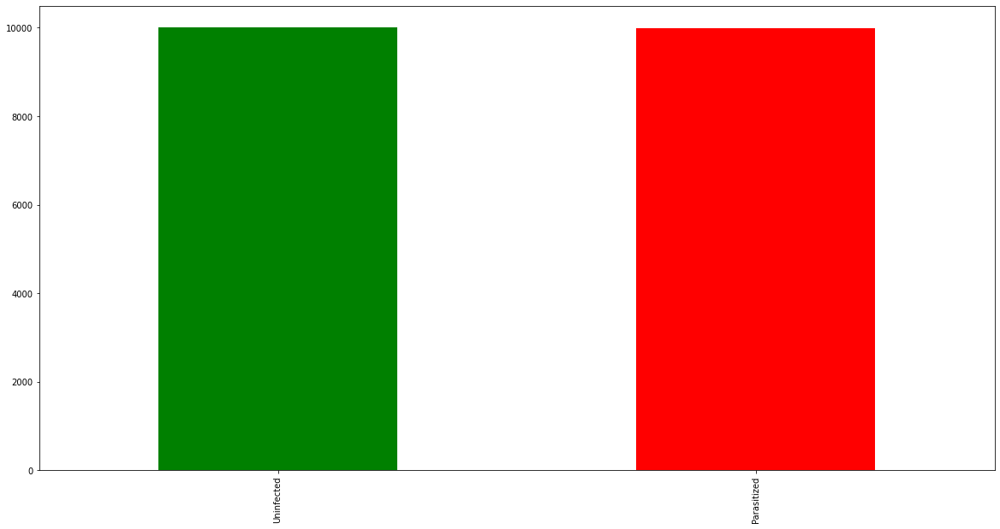

In [3]:
# How many images are there of each breed?
labels_csv["Result"].value_counts().plot.bar(figsize=(20, 10), color = ['green', 'red']);

In [4]:
len(labels_csv)

19999

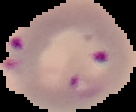

In [5]:
from IPython.display import display, Image
Image("/content/drive/MyDrive/Dissertation /cell_images/train/999.png")

In [6]:
labels_csv["ID"] = labels_csv['ID'].astype("str")
labels_csv

,ID,Result
0,1,Parasitized
1,2,Parasitized
2,3,Parasitized
3,4,Parasitized
4,5,Parasitized
...,...,...
19994,23777,Uninfected
19995,23778,Uninfected
19996,23779,Uninfected
19997,23780,Uninfected


In [7]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dissertation /cell_images/train/" + fname + ".png" for fname in labels_csv["ID"]]

# Check the first 10 filenames
filenames[:10]

['/content/drive/MyDrive/Dissertation /cell_images/train/1.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/2.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/3.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/4.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/5.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/6.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/7.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/8.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/9.png',
 '/content/drive/MyDrive/Dissertation /cell_images/train/10.png']

In [8]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dissertation /cell_images/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!


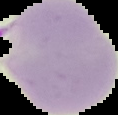

In [9]:
# Check an image directly from a filepath
Image(filenames[28])

In [10]:
import numpy as np
labels = labels_csv["Result"].to_numpy() # convert labels column to NumPy array
labels[:10]

array(['Parasitized', 'Parasitized', 'Parasitized', 'Parasitized',
       'Parasitized', 'Parasitized', 'Parasitized', 'Parasitized',
       'Parasitized', 'Parasitized'], dtype=object)

In [11]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


In [12]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

2

In [13]:
# Example: Turn one label into an array of booleans
print(labels[0])
labels[0] == unique_breeds # use comparison operator to create boolean array

Parasitized


array([ True, False])

In [14]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:5]

[array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False]),
 array([ True, False])]

In [15]:
# Example: Turning a boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

Parasitized
0
0
[1 0]


In [16]:
#Finding unique label values 
uniquebreed = np.unique(labels)
len(uniquebreed)

2

In [17]:
#Turning a single Label into an array of booleans
print(labels[0])
labels[0] == uniquebreed 

Parasitized


array([ True, False])

In [18]:
#Turning every label into a boolean array
boolean_label = [label == uniquebreed for label in labels]
boolean_label[:2]

[array([ True, False]), array([ True, False])]

## Creating our own validation set

In [19]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [20]:
# Set number of images to use for experimenting
NUM_IMAGES = 20000 #@param {type:"slider", min:2000, max:20000, step:2000}
NUM_IMAGES

20000

In [21]:
# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES 
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES], 
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(15999, 15999, 4000, 4000)

In [22]:
# Check out the training data (image file paths and labels)
X_train[:5], y_train[:5]

(['/content/drive/MyDrive/Dissertation /cell_images/train/5896.png',
  '/content/drive/MyDrive/Dissertation /cell_images/train/3730.png',
  '/content/drive/MyDrive/Dissertation /cell_images/train/8960.png',
  '/content/drive/MyDrive/Dissertation /cell_images/train/7673.png',
  '/content/drive/MyDrive/Dissertation /cell_images/train/6001.png'],
 [array([ True, False]),
  array([ True, False]),
  array([ True, False]),
  array([ True, False]),
  array([ True, False])])

## Preprocessing images (turning images into Tensors)

In [23]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[58]) # read in an image
image.shape

(100, 118, 3)

In [24]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 118, 3), dtype=float32, numpy=
array([[[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.    

In [25]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Creating data batches

In [26]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [27]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [28]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [29]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

## Visualizing data batches

In [30]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

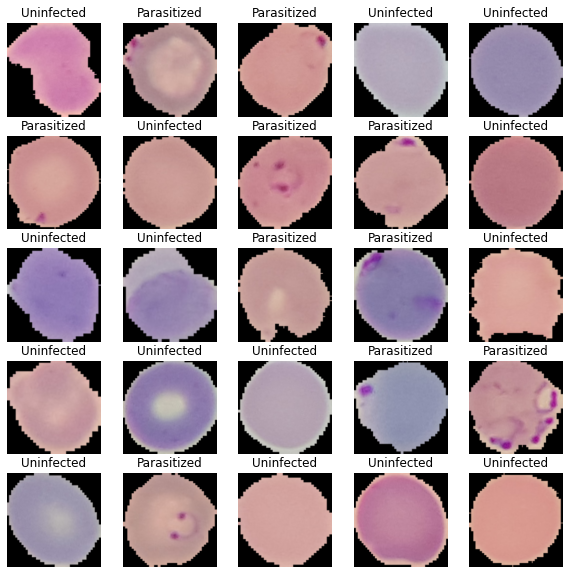

In [31]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

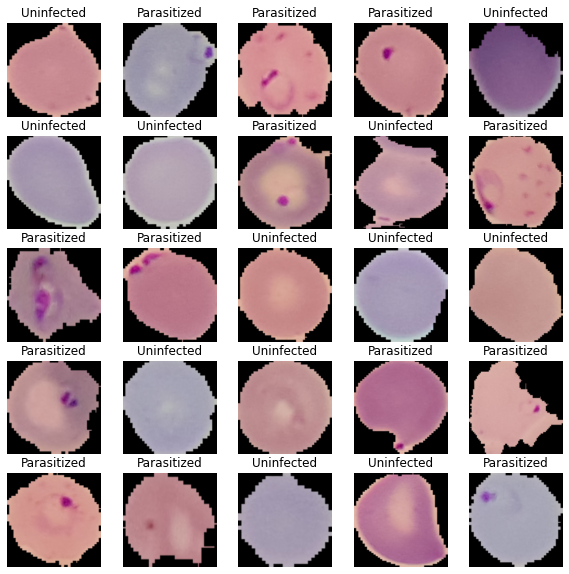

In [32]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Creating and training a model

In [33]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/resnet_v1_50/classification/5"

In [34]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model


In [35]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/resnet_v1_50/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              25612201  
                                                                 
 dense (Dense)               (None, 2)                 2004      
                                                                 
Total params: 25,614,205
Trainable params: 2,004
Non-trainable params: 25,612,201
_________________________________________________________________


In [36]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [37]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dissertation /cell_images/data/models/ResNet50/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [38]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

In [39]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [40]:
def visualize_training(model, lw= 3):
    plt.figure(figsize=(10,6))
    plt.plot(model.history['accuracy'], label = 'training', marker = '*', linewidth = lw)
    plt.plot(model.history['val_accuracy'], label = 'validation', marker = 'o', linewidth = lw)
    plt.title('Training Accuracy vs Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend(fontsize = 'x-large')
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(model.history['loss'], label = 'training', marker = '*', linewidth = lw)
    plt.plot(model.history['val_loss'], label = 'validation', marker = 'o', linewidth = lw)
    plt.title('Training Loss vs Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(fontsize = 'x-large')
    plt.show()

In [41]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  vis = model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  visualize_training(vis)
  return model

Building model with: https://tfhub.dev/google/imagenet/resnet_v1_50/classification/5
Epoch 1/100
500/500 [==============================] - 2331s 5s/step - loss: 0.2567 - accuracy: 0.8968 - val_loss: 0.1758 - val_accuracy: 0.9362
Epoch 2/100
500/500 [==============================] - 102s 203ms/step - loss: 0.1865 - accuracy: 0.9284 - val_loss: 0.1647 - val_accuracy: 0.9410
Epoch 3/100
500/500 [==============================] - 102s 203ms/step - loss: 0.1791 - accuracy: 0.9340 - val_loss: 0.1873 - val_accuracy: 0.9340
Epoch 4/100
500/500 [==============================] - 102s 203ms/step - loss: 0.1720 - accuracy: 0.9370 - val_loss: 0.1771 - val_accuracy: 0.9350
Epoch 5/100
500/500 [==============================] - 102s 203ms/step - loss: 0.1707 - accuracy: 0.9372 - val_loss: 0.1598 - val_accuracy: 0.9482
Epoch 6/100
500/500 [==============================] - 103s 205ms/step - loss: 0.1657 - accuracy: 0.9386 - val_loss: 0.2559 - val_accuracy: 0.9120
Epoch 7/100
500/500 [==============

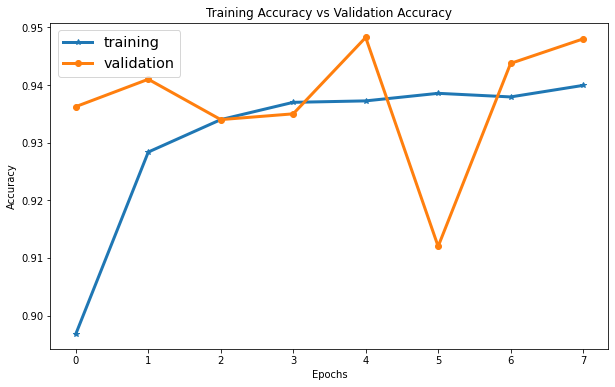

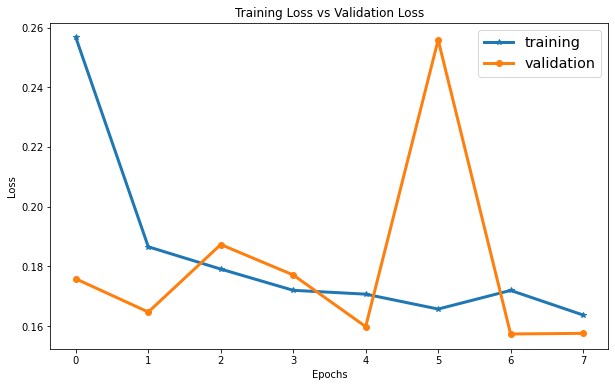

In [42]:
# Fit the model to the data
model = train_model()

In [43]:
%tensorboard --logdir drive/My\ Drive/Dissertation\ /cell_images/data/models/ResNet50/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [44]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

125/125 [==============================] - 21s 157ms/step


array([[4.2913605e-02, 9.5708644e-01],
       [6.1415052e-01, 3.8584945e-01],
       [9.9998474e-01, 1.5312362e-05],
       ...,
       [9.1756856e-01, 8.2431473e-02],
       [9.8662925e-01, 1.3370728e-02],
       [3.6879936e-01, 6.3120061e-01]], dtype=float32)

In [45]:
# Check the shape of predictions
predictions.shape

(4000, 2)

In [46]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[0.0429136  0.95708644]
Max value (probability of prediction): 0.957086443901062
Sum: 1.0
Max index: 1
Predicted label: Uninfected


In [47]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'Uninfected'

In [48]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        ...,
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]], dtype=float32), 'Uninfected')

In [49]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

In [50]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 20 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 20 prediction confidence indexes
  top_20_pred_indexes = pred_prob.argsort()[-20:][::-1]
  # Find the top 20 prediction confidence values
  top_20_pred_values = pred_prob[top_20_pred_indexes]
  # Find the top 20 prediction labels
  top_20_pred_labels = unique_breeds[top_20_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_20_pred_labels)), 
                     top_20_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_20_pred_labels)),
             labels=top_20_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_20_pred_labels):
    top_plot[np.argmax(top_20_pred_labels == true_label)].set_color("green")
  else:
    pass

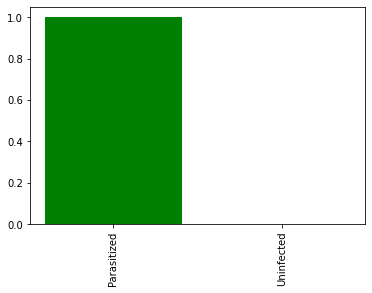

In [51]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=2)

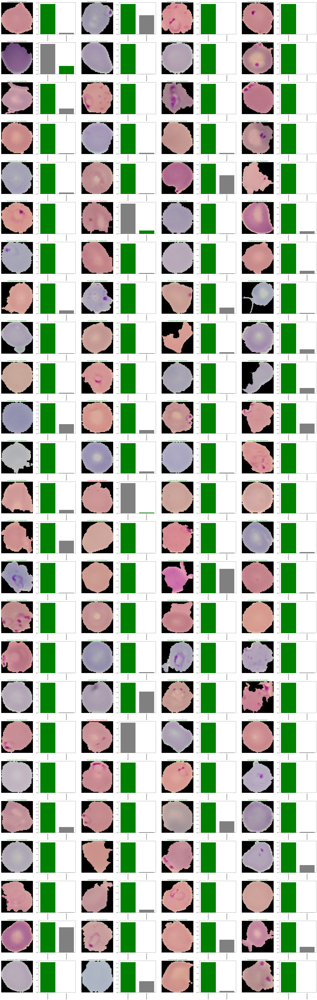

In [52]:

# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 25
num_cols = 4
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a mode

In [53]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dissertation /cell_images/data/models/ResNet50",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [54]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [55]:
# Save our model 
#save_model(model, suffix="ResNet50")